In [1]:
import tensorflow as tf
gpus = tf.config.list_physical_devices("GPU")

if gpus:
    print("Found GPU :", gpus)
else:
    print("Fail to detect")

Found GPU : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [13]:
import os
import glob
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from network import AttNet
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
import lpips
import torch
from tqdm import tqdm

# Initialize the model
model = AttNet(use_an=True)

# Load the latest checkpoint
ckpt = tf.train.Checkpoint(model=model)
status = ckpt.restore(tf.train.latest_checkpoint("checkpoints"))
status.expect_partial()  # Silences the warnings

# Get paths to source and reference images and sort them
src_paths = sorted(glob.glob("Image(Expert_E_256)/raw_test/*"))
ref_paths = sorted(glob.glob("Image(Expert_E_256)/expert_test/*"))

# Load prompts
input_prompts_df = pd.read_csv("raw_encoded_test.csv")
reference_prompts_df = pd.read_csv("expert_encoded_test.csv")

# Create dictionaries for quick lookup
input_prompts_dict = dict(zip(input_prompts_df['image'], input_prompts_df['encoded_prompt'].apply(eval)))
reference_prompts_dict = dict(zip(reference_prompts_df['image'], reference_prompts_df['encoded_prompt'].apply(eval)))

In [14]:
# Initialize LPIPS loss function
loss_fn = lpips.LPIPS(net='alex')

# Initialize lists to store metric values
psnr_values = []
ssim_values = []
lpips_values = []

# Loop through all image pairs with tqdm progress bar
for src_path, ref_path in tqdm(zip(src_paths, ref_paths), total=len(src_paths), desc="Processing Images"):
    # Load and resize images
    img_src = np.array(Image.open(src_path).resize((256,256)))
    img_ref = np.array(Image.open(ref_path).resize((256,256)))

    # Normalize images to [-1, 1]
    img_src_normed = (img_src.astype(np.float32) / 127.5) - 1
    img_ref_normed = (img_ref.astype(np.float32) / 127.5) - 1

    # Convert images to tensors and add batch dimension
    src_tensor = tf.expand_dims(img_src_normed, axis=0)
    ref_tensor = tf.expand_dims(img_ref_normed, axis=0)

    # Get the corresponding prompts
    img_name = os.path.basename(src_path)
    input_prompt = input_prompts_dict[img_name]
    reference_prompt = reference_prompts_dict[img_name]

    # Convert prompts to tensors
    input_prompt_tensor = tf.expand_dims(tf.convert_to_tensor(input_prompt, dtype=tf.float32), axis=0)
    reference_prompt_tensor = tf.expand_dims(tf.convert_to_tensor(reference_prompt, dtype=tf.float32), axis=0)

    # Perform inference
    out_tensor = model(src_tensor, ref_tensor, input_prompts=input_prompt_tensor, reference_prompts=reference_prompt_tensor, alpha=1.0)
    img_out = out_tensor.numpy()[0]
    img_out = (img_out + 1) * 127.5
    img_out = img_out.astype(np.uint8)

    # Calculate PSNR
    psnr_value = psnr(img_ref, img_out)
    psnr_values.append(psnr_value)

    # Calculate SSIM
    ssim_value, ssim_map = ssim(img_ref, img_out, full=True, channel_axis=-1)
    ssim_values.append(ssim_value)

    # Convert images to PyTorch tensors and normalize to [-1, 1]
    img_out_tensor = torch.tensor(img_out).permute(2, 0, 1).unsqueeze(0).float() / 127.5 - 1
    img_ref_tensor = torch.tensor(img_ref).permute(2, 0, 1).unsqueeze(0).float() / 127.5 - 1

    # Compute LPIPS value
    lpips_value = loss_fn(img_out_tensor, img_ref_tensor)
    lpips_values.append(lpips_value.item())

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


D:\anaconda3\envs\Lichin\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\anaconda3\envs\Lichin\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: D:\anaconda3\envs\Lichin\lib\site-packages\lpips\weights\v0.1\alex.pth


Processing Images: 100%|█████████████████████████████████████████████████████████████| 500/500 [02:28<00:00,  3.36it/s]


In [15]:
# Calculate average values
avg_psnr = np.mean(psnr_values)
avg_ssim = np.mean(ssim_values)
avg_lpips = np.mean(lpips_values)

print(f"Average PSNR: {avg_psnr:.4f}")
print(f"Average SSIM: {avg_ssim:.4f}")
print(f"Average LPIPS: {avg_lpips:.4f}")

Average PSNR: 18.9151
Average SSIM: 0.7332
Average LPIPS: 0.2078


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: D:\anaconda3\envs\Lichin\lib\site-packages\lpips\weights\v0.1\alex.pth


Processing Images:   0%|                                                                       | 0/500 [00:00<?, ?it/s]

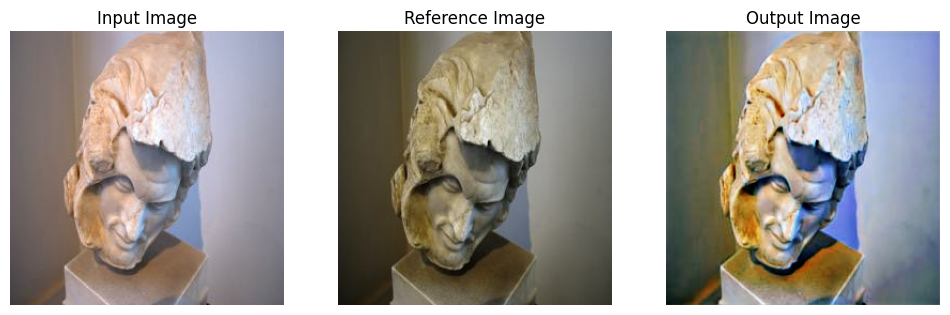

Processing Images:   0%|▏                                                              | 1/500 [00:00<08:13,  1.01it/s]

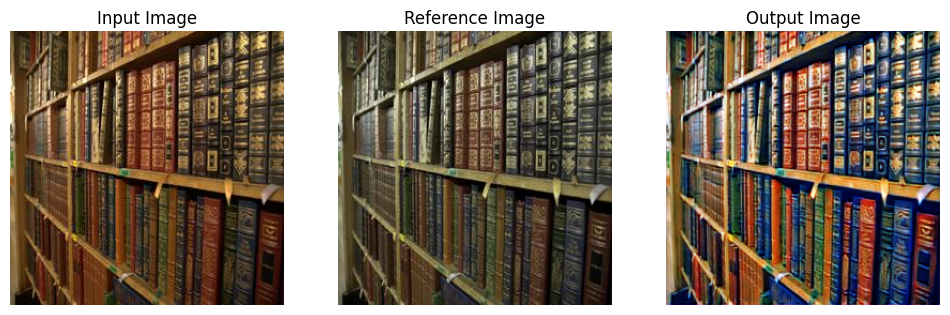

Processing Images:   0%|▎                                                              | 2/500 [00:01<06:36,  1.26it/s]

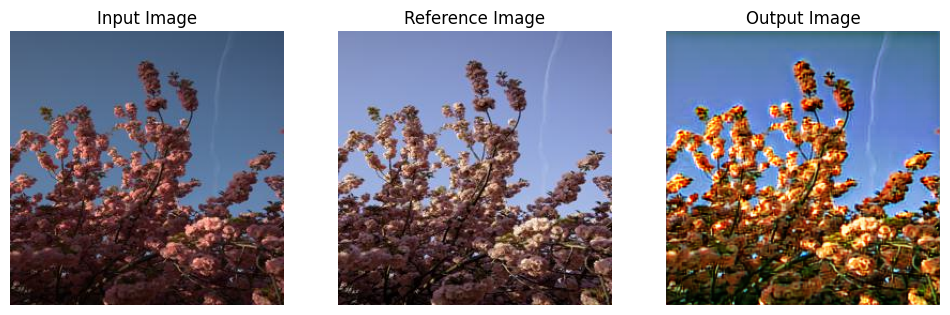

Processing Images:   1%|▍                                                              | 3/500 [00:02<05:35,  1.48it/s]

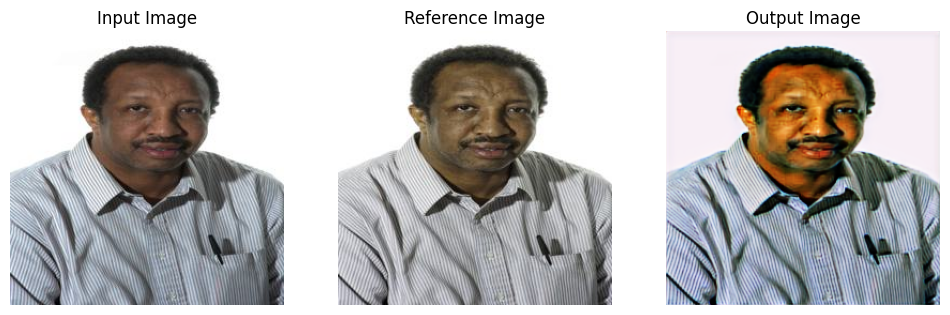

Processing Images:   1%|▌                                                              | 4/500 [00:02<05:07,  1.61it/s]

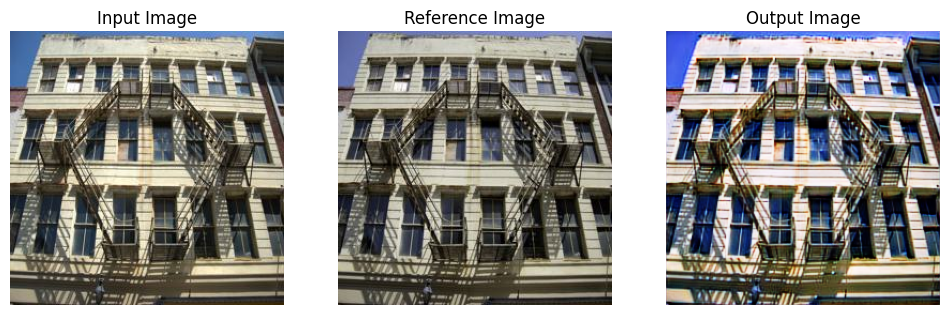

Processing Images:   1%|▋                                                              | 5/500 [00:03<04:58,  1.66it/s]

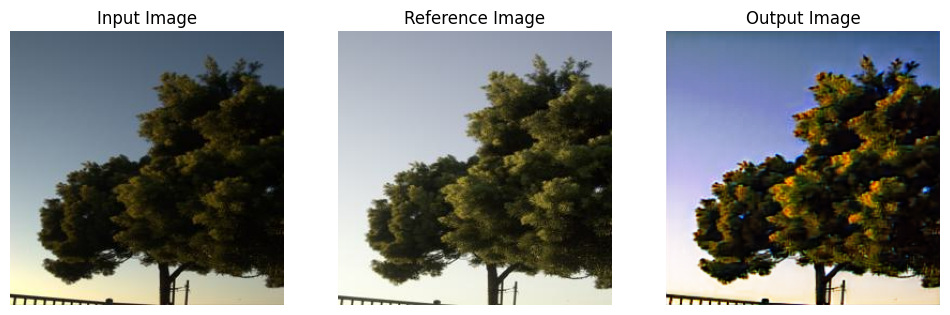

Processing Images:   1%|▊                                                              | 6/500 [00:03<04:49,  1.71it/s]

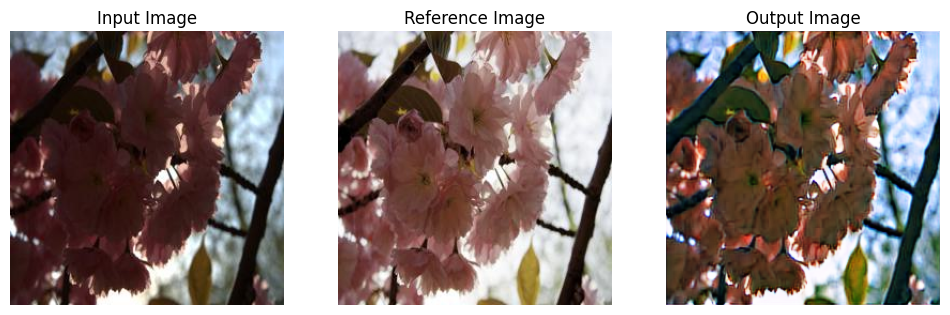

Processing Images:   1%|▉                                                              | 7/500 [00:04<04:46,  1.72it/s]

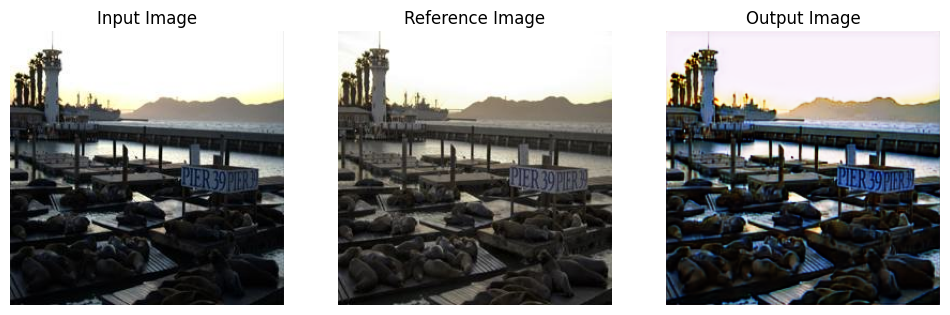

Processing Images:   2%|█                                                              | 8/500 [00:04<04:45,  1.72it/s]

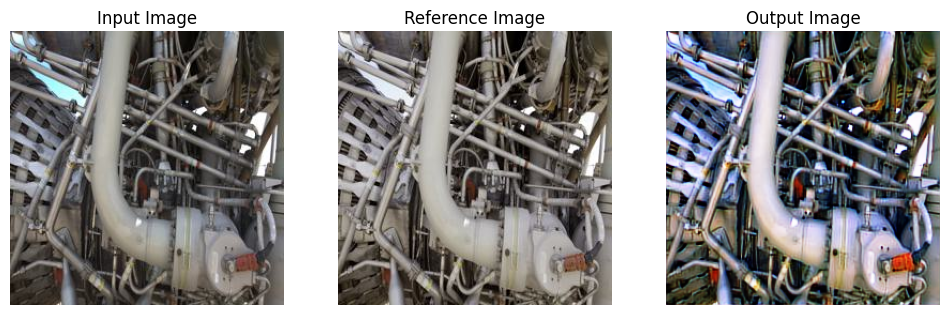

Processing Images:   2%|█▏                                                             | 9/500 [00:05<05:48,  1.41it/s]

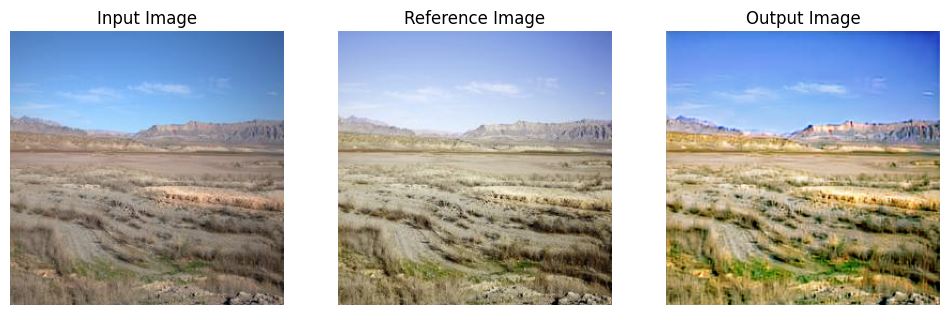

Processing Images:   2%|█▏                                                            | 10/500 [00:06<05:24,  1.51it/s]

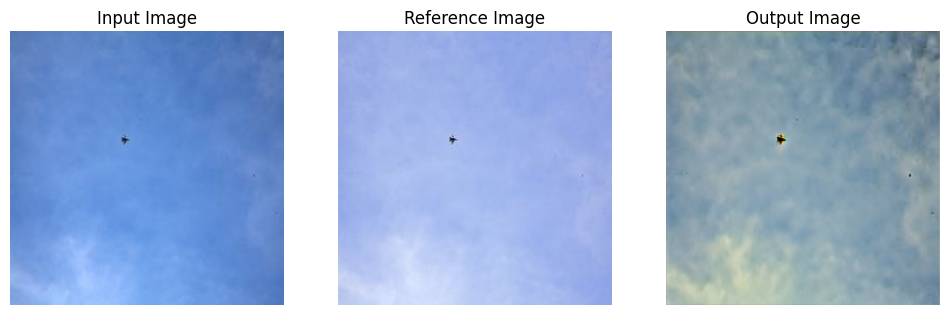

Processing Images:   2%|█▎                                                            | 11/500 [00:07<05:06,  1.60it/s]

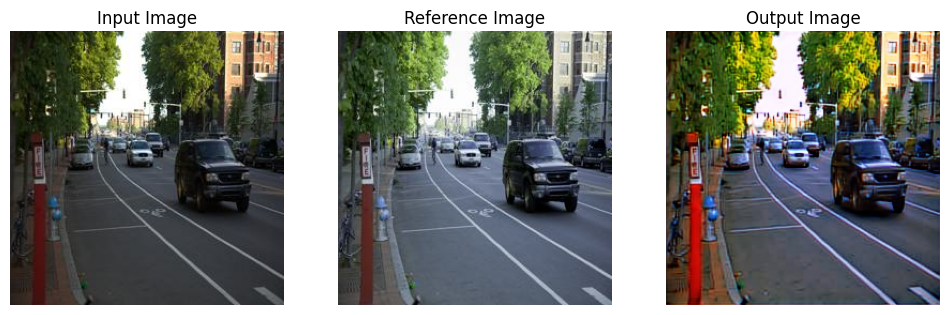

Processing Images:   2%|█▍                                                            | 12/500 [00:07<04:58,  1.64it/s]

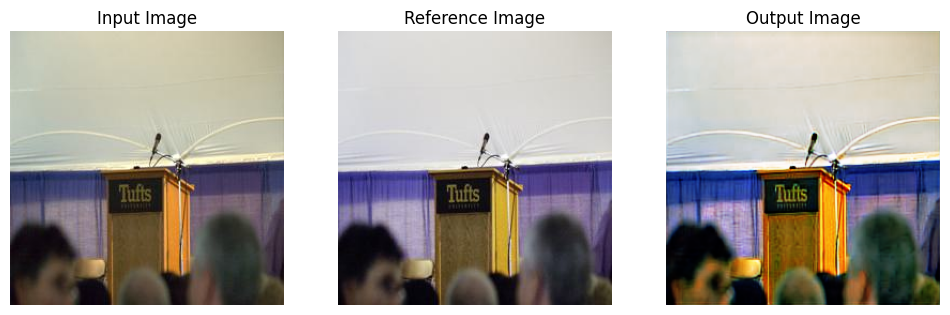

Processing Images:   3%|█▌                                                            | 13/500 [00:08<04:46,  1.70it/s]

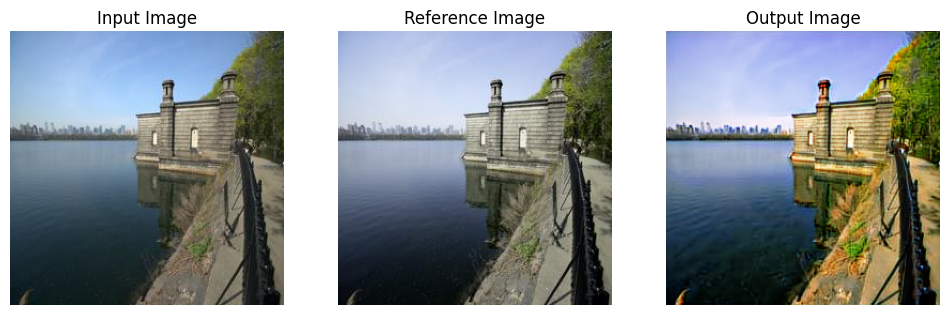

Processing Images:   3%|█▋                                                            | 14/500 [00:08<04:39,  1.74it/s]

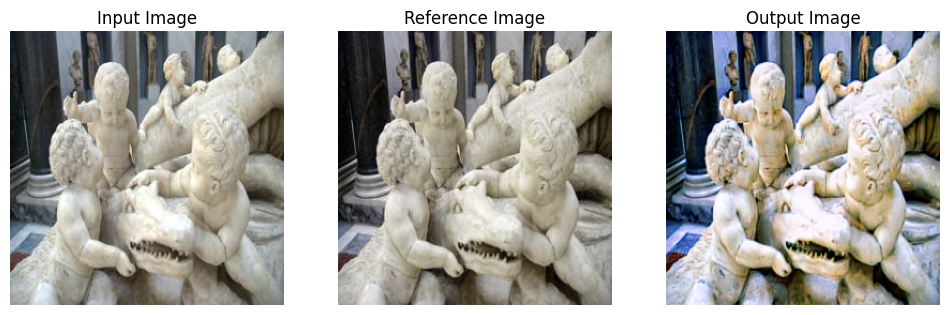

Processing Images:   3%|█▊                                                            | 15/500 [00:09<04:38,  1.74it/s]

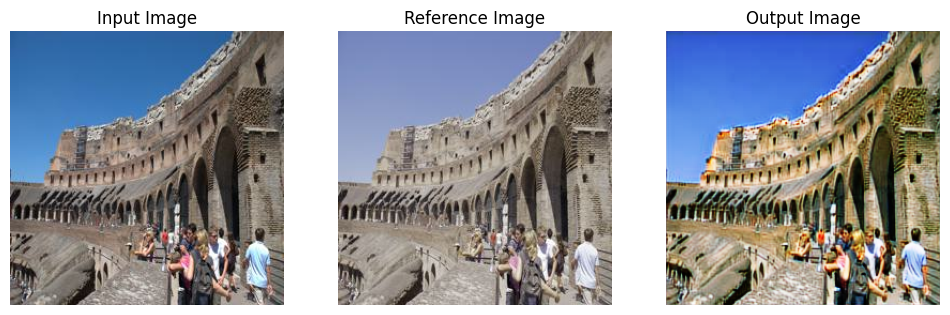

Processing Images:   3%|█▉                                                            | 16/500 [00:09<04:34,  1.76it/s]

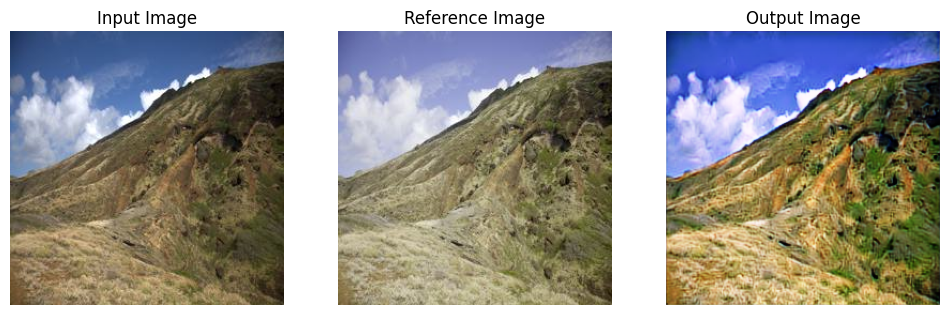

Processing Images:   3%|██                                                            | 17/500 [00:10<04:35,  1.76it/s]

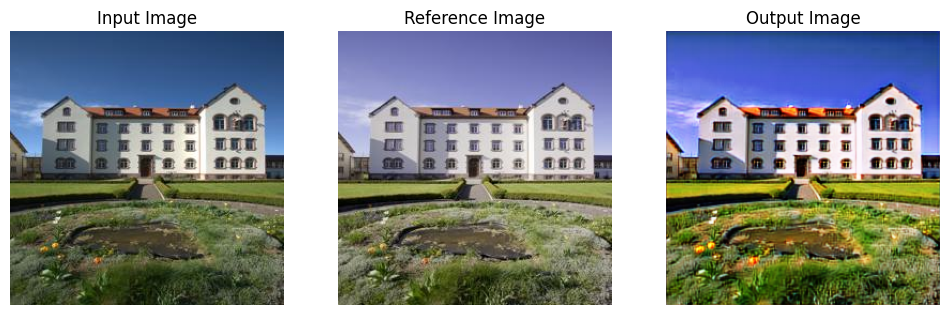

Processing Images:   4%|██▏                                                           | 18/500 [00:11<04:33,  1.76it/s]

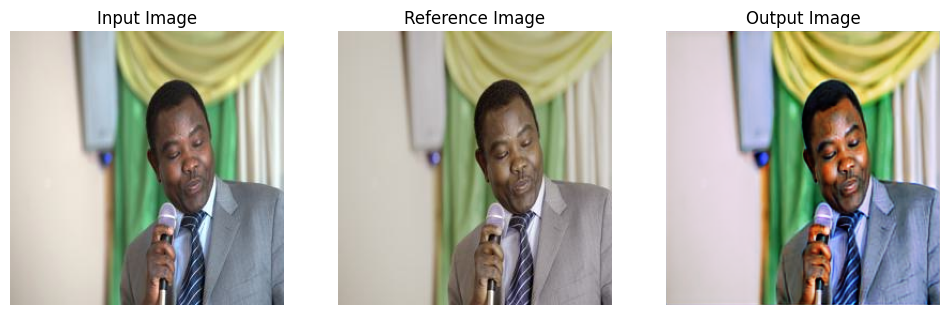

Processing Images:   4%|██▎                                                           | 19/500 [00:11<04:31,  1.77it/s]

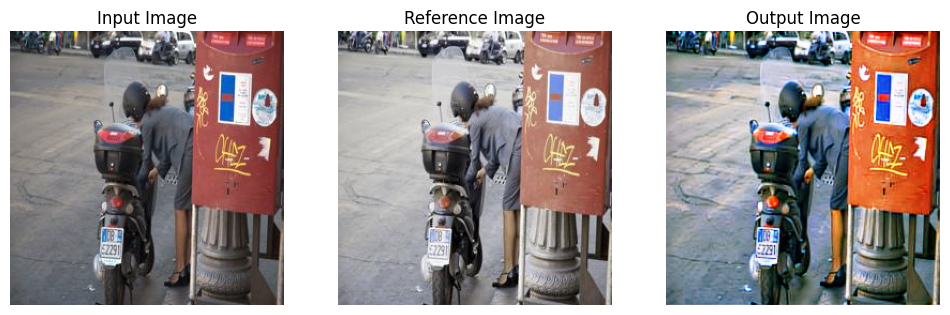

Processing Images:   4%|██▍                                                           | 20/500 [00:12<04:34,  1.75it/s]

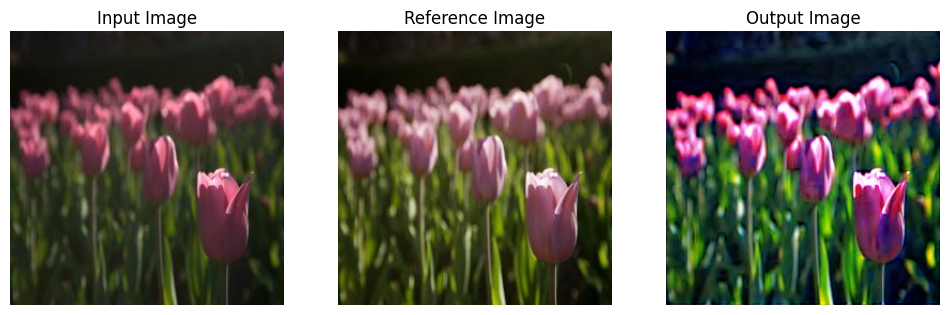

Processing Images:   4%|██▌                                                           | 21/500 [00:12<04:37,  1.72it/s]

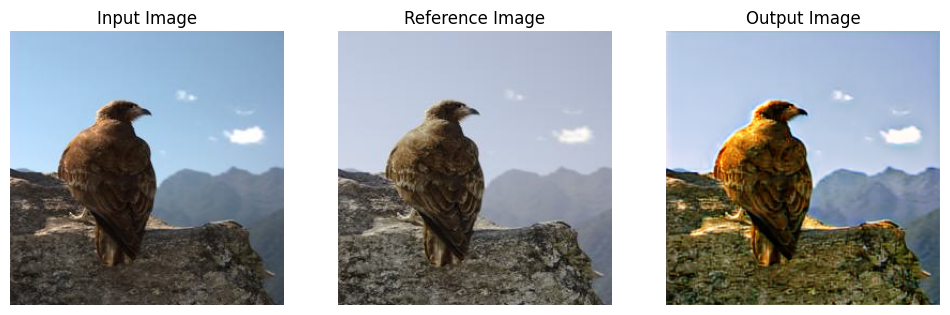

Processing Images:   4%|██▋                                                           | 22/500 [00:13<04:32,  1.75it/s]

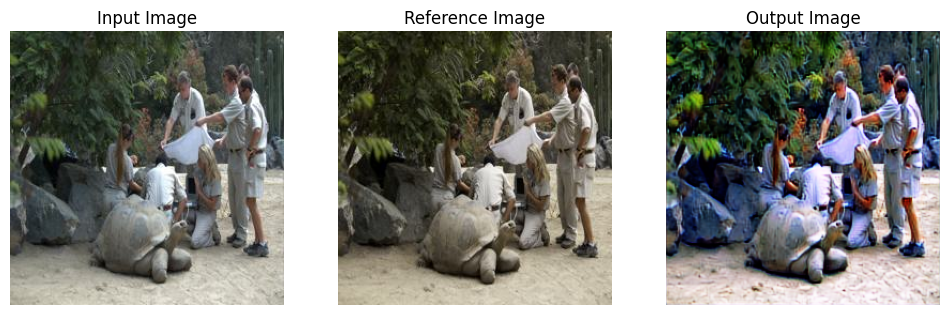

Processing Images:   5%|██▊                                                           | 23/500 [00:13<04:35,  1.73it/s]

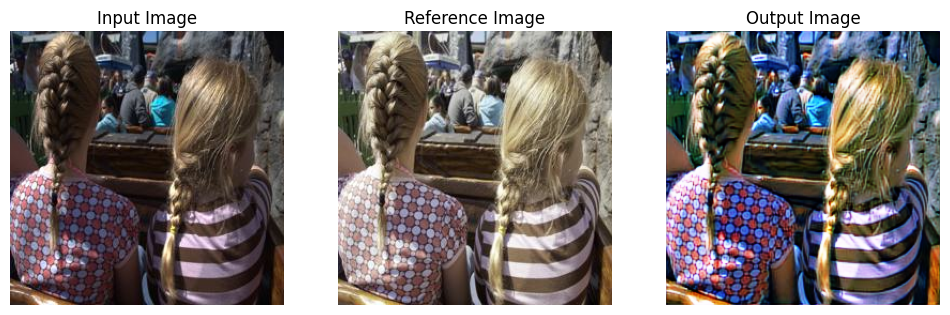

Processing Images:   5%|██▉                                                           | 24/500 [00:15<04:57,  1.60it/s]


KeyboardInterrupt: 

In [16]:
# Initialize LPIPS loss function
loss_fn = lpips.LPIPS(net='alex')

# Initialize lists to store metric values
psnr_values = []
ssim_values = []
lpips_values = []

# Loop through all image pairs with tqdm progress bar
for src_path, ref_path in tqdm(zip(src_paths, ref_paths), total=len(src_paths), desc="Processing Images"):
    # Load and resize images
    img_src = np.array(Image.open(src_path).resize((256,256)))
    img_ref = np.array(Image.open(ref_path).resize((256,256)))

    # Normalize images to [-1, 1]
    img_src_normed = (img_src.astype(np.float32) / 127.5) - 1
    img_ref_normed = (img_ref.astype(np.float32) / 127.5) - 1

    # Convert images to tensors and add batch dimension
    src_tensor = tf.expand_dims(img_src_normed, axis=0)
    ref_tensor = tf.expand_dims(img_ref_normed, axis=0)

    # Get the corresponding prompts
    img_name = os.path.basename(src_path)
    input_prompt = input_prompts_dict[img_name]
    reference_prompt = reference_prompts_dict[img_name]

    # Convert prompts to tensors
    input_prompt_tensor = tf.expand_dims(tf.convert_to_tensor(input_prompt, dtype=tf.float32), axis=0)
    reference_prompt_tensor = tf.expand_dims(tf.convert_to_tensor(reference_prompt, dtype=tf.float32), axis=0)

    # Perform inference
    out_tensor = model(src_tensor, ref_tensor, input_prompts=input_prompt_tensor, reference_prompts=reference_prompt_tensor, alpha=1.0)
    img_out = out_tensor.numpy()[0]
    img_out = (img_out + 1) * 127.5
    img_out = img_out.astype(np.uint8)

    # Calculate PSNR
    psnr_value = psnr(img_ref, img_out)
    psnr_values.append(psnr_value)

    # Calculate SSIM
    ssim_value, ssim_map = ssim(img_ref, img_out, full=True, channel_axis=-1)
    ssim_values.append(ssim_value)

    # Convert images to PyTorch tensors and normalize to [-1, 1]
    img_out_tensor = torch.tensor(img_out).permute(2, 0, 1).unsqueeze(0).float() / 127.5 - 1
    img_ref_tensor = torch.tensor(img_ref).permute(2, 0, 1).unsqueeze(0).float() / 127.5 - 1

    # Compute LPIPS value
    lpips_value = loss_fn(img_out_tensor, img_ref_tensor)
    lpips_values.append(lpips_value.item())

    # Display the images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.title('Input Image')
    plt.imshow(img_src)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title('Reference Image')
    plt.imshow(img_ref)
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title('Output Image')
    plt.imshow(img_out)
    plt.axis('off')

    plt.show()